In [34]:
%matplotlib inline

import matplotlib.pylab as plt
from mpl_toolkits.axes_grid1 import make_axes_locatable

import numpy as np
import pandas as pd
import os, sys
from time import time
from datetime import date
import logging
import pickle
import scipy
from scipy.io import mmread
import gzip
from operator import itemgetter
from scipy.sparse import csc_matrix, csr_matrix
import json, pprint
import scanpy as sc
import scanpy.external as sce
import anndata
import bbknn
import seaborn as sns
from scipy.sparse import issparse
import rpy2.robjects as ro
import anndata2ri
import inspect
SMALL_SIZE = 12
MEDIUM_SIZE = 14
BIGGER_SIZE = 16

plt.rc('font', size=SMALL_SIZE)          # controls default text sizes
plt.rc('axes', titlesize=SMALL_SIZE)     # fontsize of the axes title
plt.rc('axes', labelsize=MEDIUM_SIZE)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('ytick', labelsize=SMALL_SIZE)    # fontsize of the tick labels
plt.rc('legend', fontsize=SMALL_SIZE)    # legend fontsize
plt.rc('figure', titlesize=BIGGER_SIZE)  # fontsize of the figure title

logger = logging.getLogger()
logger.setLevel(logging.INFO)
log_info = logger.warning

## Path

In [2]:
excel_data_df = pd.read_excel("../doc/20200707_scRNAseq_info.xlsx")
sample_prefix_list = excel_data_df["sample.id"]
read_path_list = []
for sample_prefix in sample_prefix_list:
    read_path_list.append(f'../data/{sample_prefix}')
analysis_out_path = os.path.join('../output', date.today().strftime('%Y%m%d'))

output_prefix = 'SCT'
if not os.path.exists(analysis_out_path):
    os.mkdir(analysis_out_path)

In [81]:
sc.settings.verbosity = 3
sc.logging.print_versions()
results_file = analysis_out_path + "_"+ f'{output_prefix}.h5ad'
sc.settings.set_figure_params(dpi=60)

scanpy==1.5.1 anndata==0.7.4 umap==0.4.6 numpy==1.19.1 scipy==1.5.2 pandas==1.0.5 scikit-learn==0.23.1 statsmodels==0.11.1 python-igraph==0.8.2 leidenalg==0.8.1


## Load data

In [4]:
excel_data_df[["sample.id","sample","Number of Cells"]]

,sample.id,sample,Number of Cells
0,584_21713_Tumor_bladder,PT21713-BT,6746
1,585_21713_Normal_bladder,PT21713-Normal,844
2,595_21720_Tumor_21720,PT21720-BT,1483
3,596_21720_Normal_21719_blood_bladder,PT21720-Blood,881
4,603_PT21753_bladder,PT21753-BT,357
5,604_PT21783_Bladder,PT21783-BT,547
6,613_PT21822_bladder,PT21822-BT,2151
7,651_bladder_tumor_22144,PT22144-BT,9615
8,652_CD45plus,PT22144-Blood,1460
9,656_BRP_22871-bladder-cancer-tumor,PT22871-BT,2207


In [5]:
expected_cells_list = excel_data_df["Number of Cells"]
sample_list = excel_data_df["sample"]

... reading from cache file cache/..-data-584_21713_Tumor_bladder-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/..-data-585_21713_Normal_bladder-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/..-data-595_21720_Tumor_21720-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/..-data-596_21720_Normal_21719_blood_bladder-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/..-data-603_PT21753_bladder-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/..-data-604_PT21783_Bladder-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/..-data-613_PT21822_bladder-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/..-data-651_bladder_tumor_22144-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cache file cache/..-data-652_CD45plus-outs-filtered_feature_bc_matrix-matrix.h5ad
... reading from cach

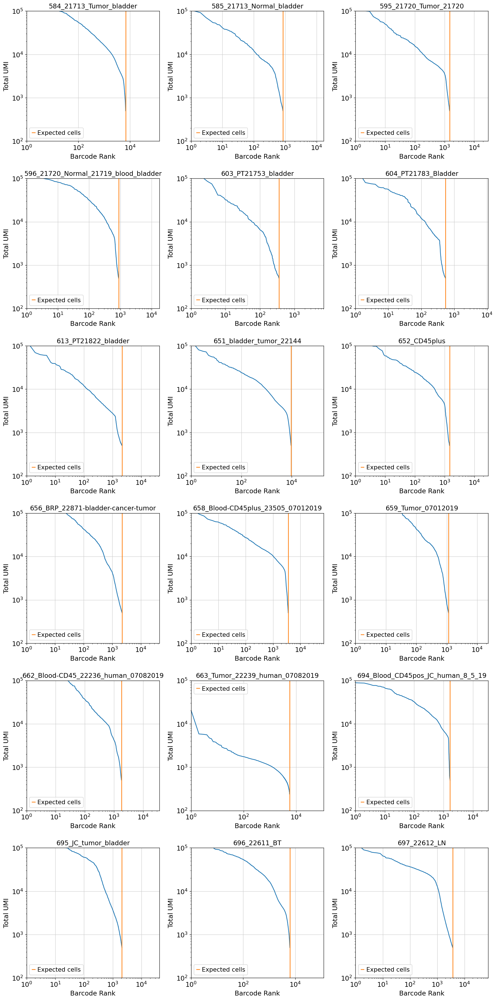

In [6]:
adata_list = []
fig, axes = plt.subplots(6, 3, figsize=(15, 30))
axs = axes.flatten()
for sample_prefix, out_path, expected_cells, sample, ax in zip(sample_prefix_list, read_path_list, expected_cells_list, sample_list, axs):
    quants_mat_mtx_gz_path = os.path.join(out_path, 'outs', 'filtered_feature_bc_matrix')
    # load cell x gene sparse expression matrix
    adata = sc.read_10x_mtx(quants_mat_mtx_gz_path, var_names='gene_symbols', cache=True)
    adata.obs["orig.ident"] = sample
    
    # save 
    adata_list.append(adata)
    # sort umi
    umi_per_barcode_list = np.asarray(adata.X.sum(-1)).flatten().tolist()
    sorted_umi_barcode_idx_list = sorted(enumerate(umi_per_barcode_list), key=itemgetter(1), reverse=True)
    sorted_umi_list = list(map(itemgetter(1), sorted_umi_barcode_idx_list))
    sorted_barcode_idx_list = list(map(itemgetter(0), sorted_umi_barcode_idx_list))
    # generate figure
    ax.plot(np.arange(1, len(sorted_umi_list) + 1), sorted_umi_list)
    ax.plot([expected_cells, expected_cells], [1e0, 1e5], label='Expected cells')
    ax.set_ylim((100, 1e5))
    ax.set_xlim((1, 20 * expected_cells))
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.set_xlabel('Barcode Rank')
    ax.set_ylabel('Total UMI')
    ax.set_title(sample_prefix)
    ax.legend()
    fig.tight_layout()

    plt.savefig(os.path.join(analysis_out_path, f'{sample_prefix}__UMI_ranked_barcode_plot.png'), dpi=100)

In [7]:
adata = adata_list[0].concatenate(adata_list[1:], batch_key='sample')

In [8]:
adata.obs['patient'] = [x.split('-', 1)[0] for x in adata.obs['orig.ident']]
adata.obs['tissue'] = [x.split('-', 1)[1] for x in adata.obs['orig.ident']]

In [9]:
adata.obs

,orig.ident,sample,patient,tissue
AAACCCAAGCACGGAT-1-0,PT21713-BT,0,PT21713,BT
AAACCCAAGGACGCAT-1-0,PT21713-BT,0,PT21713,BT
AAACCCAAGGGCGAAG-1-0,PT21713-BT,0,PT21713,BT
AAACCCACAATACCTG-1-0,PT21713-BT,0,PT21713,BT
AAACCCACAATCCTAG-1-0,PT21713-BT,0,PT21713,BT
...,...,...,...,...
TTTGTTGCAAGTTGGG-1-17,PT22611-LN,17,PT22611,LN
TTTGTTGCACTTGGCG-1-17,PT22611-LN,17,PT22611,LN
TTTGTTGGTAGCTCGC-1-17,PT22611-LN,17,PT22611,LN
TTTGTTGGTCGCTTAA-1-17,PT22611-LN,17,PT22611,LN


In [10]:
adata.obs['orig.ident'].value_counts()

PT22144-BT        9615
PT21713-BT        6746
PT22611-BT        6268
PT22236-BT        5684
PT22611-LN        3686
PT23505-Blood     3558
PT22871-BT        2207
PT21822-BT        2151
PtJC-BT           2094
PT22236-Blood     1813
PtJC-Blood        1672
PT21720-BT        1483
PT22144-Blood     1460
PT23505-BT        1150
PT21720-Blood      881
PT21713-Normal     844
PT21783-BT         547
PT21753-BT         357
Name: orig.ident, dtype: int64

In [11]:
adata.obs['patient'].value_counts()

PT22144    11075
PT22611     9954
PT21713     7590
PT22236     7497
PT23505     4708
PtJC        3766
PT21720     2364
PT22871     2207
PT21822     2151
PT21783      547
PT21753      357
Name: patient, dtype: int64

## Preprocessing

In [12]:
sc.settings.set_figure_params(dpi=120)

normalizing counts per cell
    finished (0:00:01)


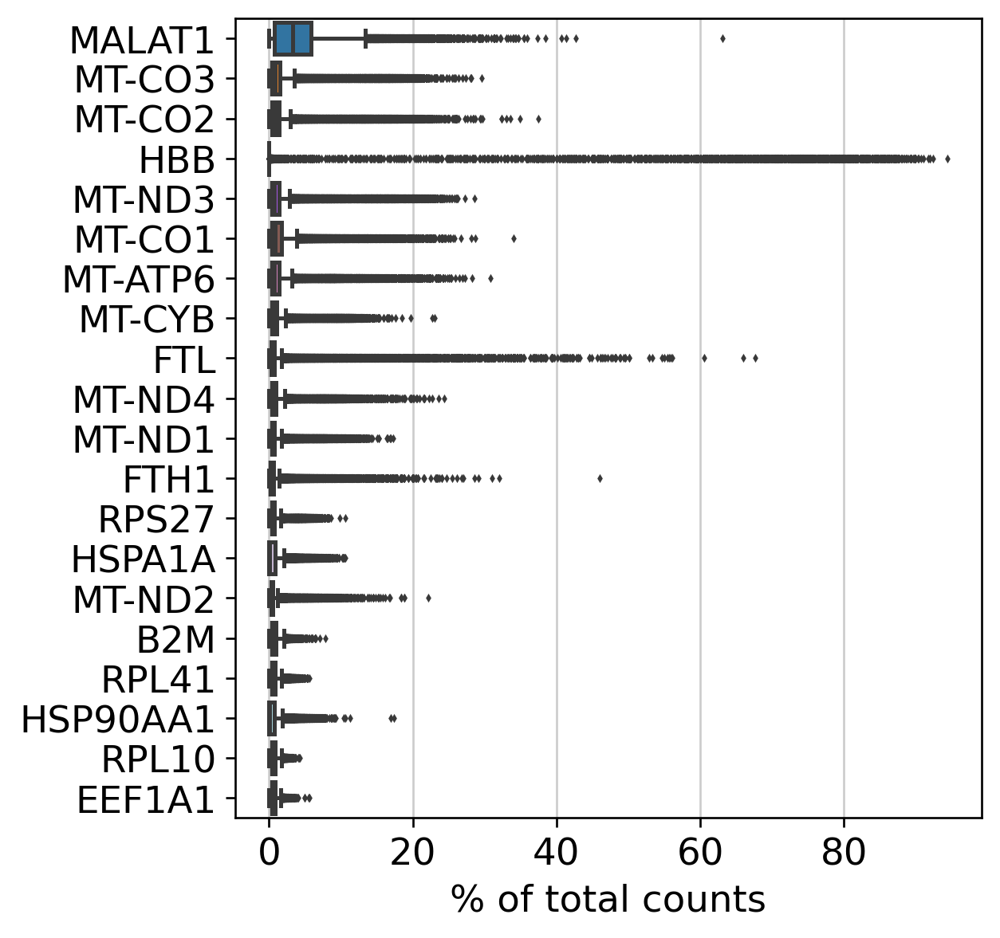

In [13]:
sc.pl.highest_expr_genes(adata, n_top=20, save="_" + output_prefix + '.png')

In [14]:
adata.var["mt"] = adata.var_names.str.startswith("MT-")
sc.pp.calculate_qc_metrics(adata, qc_vars=["mt"], inplace=True)

In [15]:
adata

AnnData object with n_obs × n_vars = 52216 × 33538
    obs: 'orig.ident', 'sample', 'patient', 'tissue', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts'

<AxesSubplot:xlabel='pct_counts_mt'>

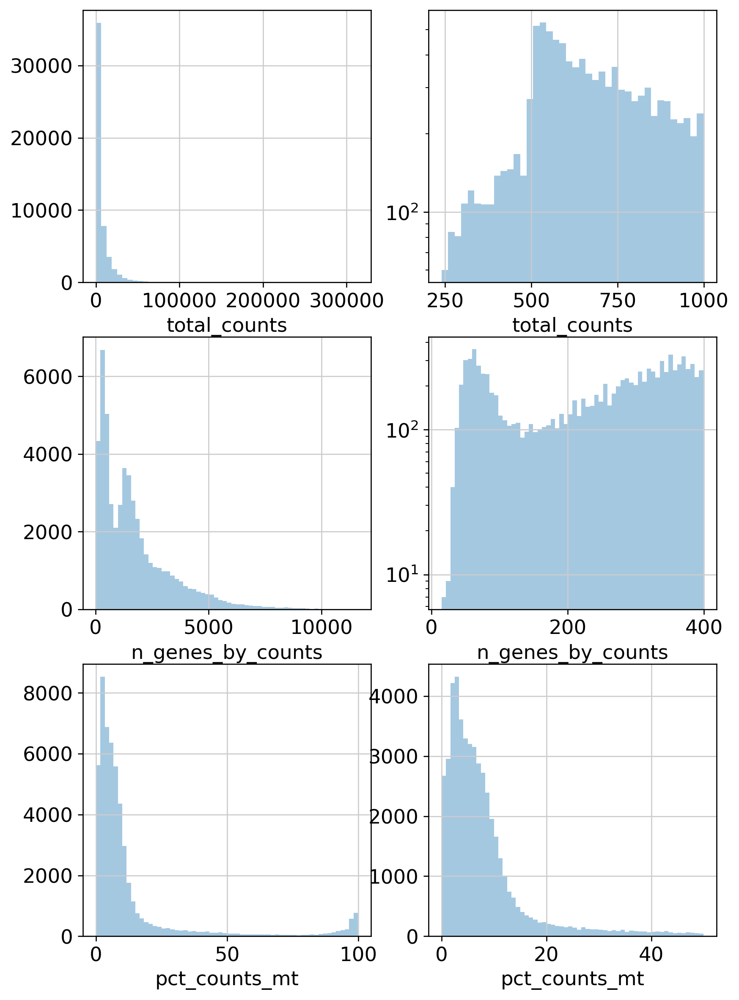

In [16]:
fig, axes = plt.subplots(3, 2, figsize=(8, 9))
axs = axes.flatten()
sns.distplot(adata.obs["total_counts"], kde=False, ax=axs[0],hist_kws={'log':False})
sns.distplot(adata.obs["total_counts"][adata.obs["total_counts"] < 1000], kde=False, bins=40, ax=axs[1],hist_kws={'log':True})
sns.distplot(adata.obs["n_genes_by_counts"], kde=False, bins=60, ax=axs[2],hist_kws={'log':False})
sns.distplot(adata.obs["n_genes_by_counts"][adata.obs["n_genes_by_counts"] < 400], kde=False, bins=60, ax=axs[3],hist_kws={'log':True})
sns.distplot(adata.obs["pct_counts_mt"], kde=False, bins=60, ax=axs[4],hist_kws={'log':False})
sns.distplot(adata.obs["pct_counts_mt"][adata.obs["pct_counts_mt"] < 50], kde=False, bins=60, ax=axs[5],hist_kws={'log':False})

In [17]:
sc.pp.filter_cells(adata, min_genes=100)
sc.pp.filter_cells(adata, min_counts=150)
sc.pp.filter_genes(adata, min_cells=3)
adata = adata[adata.obs['pct_counts_mt'] < 50]

filtered out 2470 cells that have less than 100 genes expressed
filtered out 6483 genes that are detected in less than 3 cells


/home/yah2014/anaconda3/envs/r4.0/lib/python3.8/site-packages/anndata/_core/anndata.py:1209: ImplicitModificationWarning: Initializing view as actual.
  warnings.warn(
Trying to set attribute `.obs` of view, copying.
... storing 'orig.ident' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'patient' as categorical
Trying to set attribute `.obs` of view, copying.
... storing 'tissue' as categorical
Trying to set attribute `.var` of view, copying.
... storing 'feature_types' as categorical


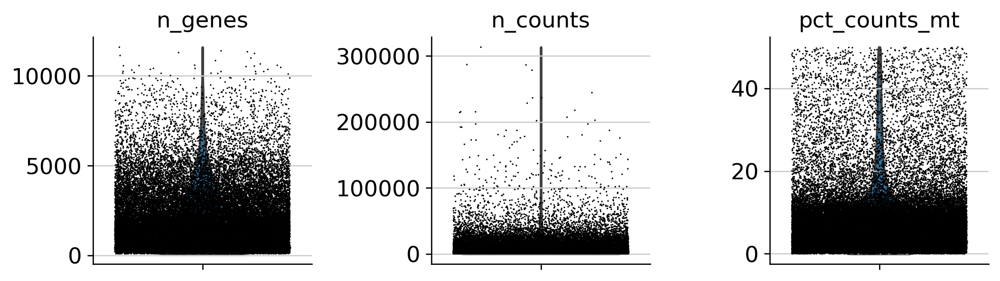

In [18]:
sc.pl.violin(adata, keys = ['n_genes', 'n_counts', 'pct_counts_mt'],
             jitter=0.4, multi_panel=True, save="_" + output_prefix + '.png')

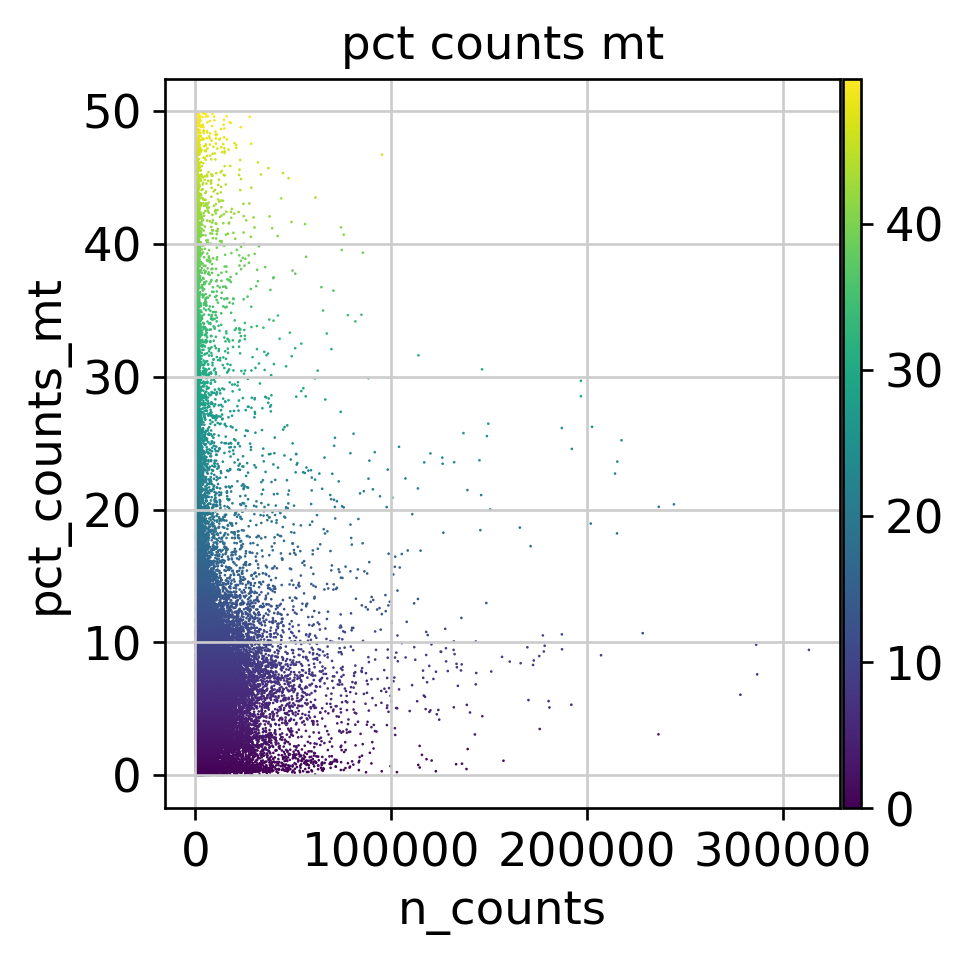

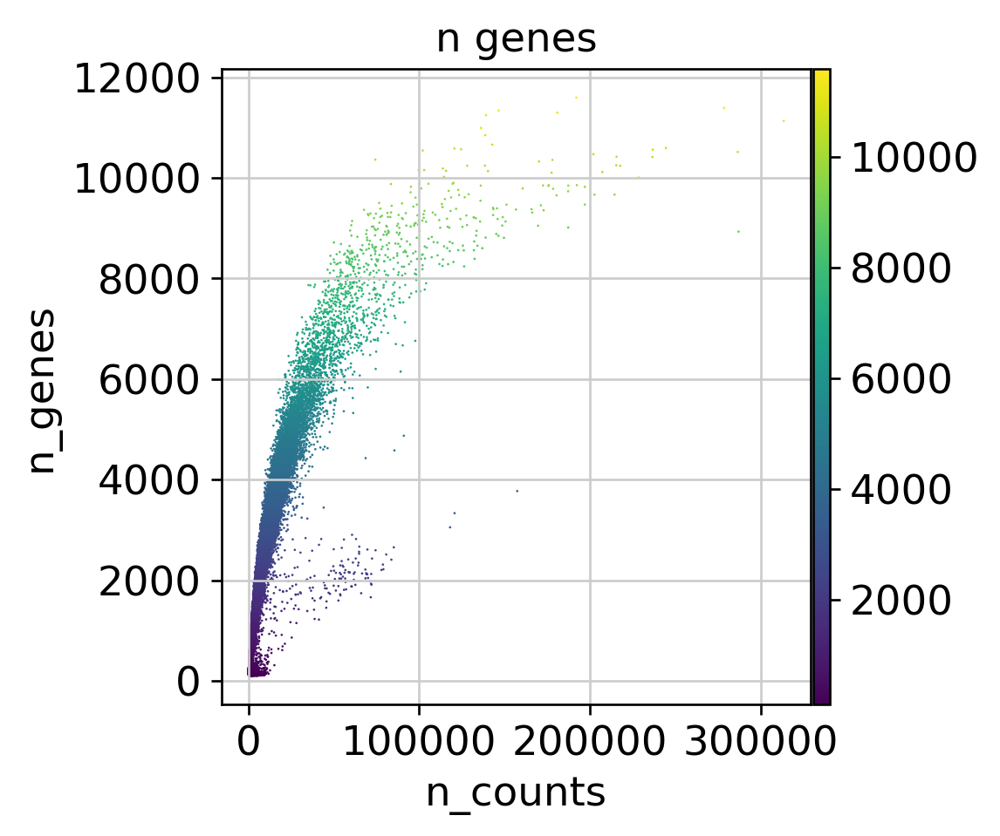

In [19]:
# show plots below each other (standard, works) # https://github.com/theislab/scanpy/issues/815
sc.pl.scatter(adata, x='n_counts', y='pct_counts_mt', color='pct_counts_mt', show=False)
sc.pl.scatter(adata, x='n_counts', y='n_genes', color='n_genes', show=False)

## SCTransform

In [10]:
import scanpy as sc
from scipy.sparse import issparse
import rpy2.robjects as ro
import anndata2ri

In [21]:
import scanpy as sc
from scipy.sparse import issparse
import rpy2.robjects as ro
import anndata2ri

def pyScTransform(adata, output_file=None):
    """
    Function to call scTransform from Python
    """
    import rpy2.robjects as ro
    import anndata2ri

    ro.r('library(Seurat)')
    ro.r('library(scater)')
    anndata2ri.activate()

    sc.pp.filter_genes(adata, min_cells=3)
    
    if issparse(adata.X):
        if not adata.X.has_sorted_indices:
            adata.X.sort_indices()

    for key in adata.layers:
        if issparse(adata.layers[key]):
            if not adata.layers[key].has_sorted_indices:
                adata.layers[key].sort_indices()

    ro.globalenv['adata'] = adata

    ro.r('seurat_obj = as.Seurat(adata, counts="X", data = NULL)')

    ro.r('res <- SCTransform(object=seurat_obj, return.only.var.genes = FALSE, do.correct.umi = TRUE)')
    x = ro.r('res@assays$SCT@counts').T
    list_of_variable_names = ro.r('rownames(seurat_obj) %in% rownames(res@assays$SCT@counts)')
    
    adata = adata[:, list_of_variable_names==1]
    adata.X = x
    return adata

    if output_file:
        adata.write(output_file)

In [ ]:
adata_SCT_list = []
for sample in sample_list:
    adata_SCT_list.append(pyScTransform(adata = adata[adata.obs["orig.ident"] == sample,:],
                                        output_file = results_file))

In [32]:
adata_SCT_list_copy = adata_SCT_list.copy()

Extract shared genes

In [26]:
share_genes = adata_SCT_list[0].var_names.to_series()
for idx in range(1,len(adata_SCT_list)):
    x = adata_SCT_list[idx].var_names.to_series()
    share_genes = set(share_genes) & set(x)
len(share_genes)

In [33]:
for idx in range(len(adata_SCT_list)):
    adata_SCT_list[idx] = adata_SCT_list[idx][:,list(share_genes)]

In [34]:
adata_SCT = adata_SCT_list[0].concatenate(adata_SCT_list[1:], batch_key='sample')

In [35]:
adata_SCT

AnnData object with n_obs × n_vars = 47579 × 9900
    obs: 'orig.ident', 'sample', 'patient', 'tissue', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'n_counts'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells-0', 'n_cells-1', 'n_cells-10', 'n_cells-11', 'n_cells-12', 'n_cells-13', 'n_cells-14', 'n_cells-15', 'n_cells-16', 'n_cells-17', 'n_cells-2', 'n_cells-3', 'n_cells-4', 'n_cells-5', 'n_cells-6', 'n_cells-7', 'n_cells-8', 'n_cells-9'

In [36]:
sc.pp.log1p(adata_SCT)

In [37]:
adata = adata_SCT

In [38]:
adata.raw = adata

extracting highly variable genes
    finished (0:00:13)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


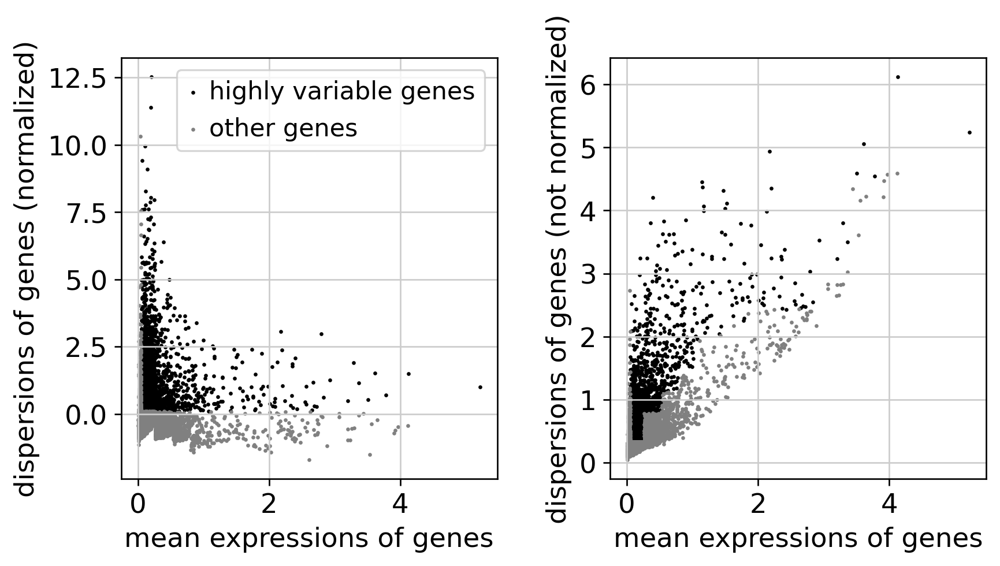

False    7515
True     2385
Name: highly_variable, dtype: int64

In [39]:
sc.pp.highly_variable_genes(adata, min_mean=0.05, max_mean=8, min_disp=0.1)
sc.pl.highly_variable_genes(adata)
adata.var['highly_variable'].value_counts()

In [40]:
adata = adata[:, adata.var['highly_variable']]

In [41]:
#To remove the problematic genes.
sc.pp.filter_genes(adata, min_counts=1)

Trying to set attribute `.var` of view, copying.


In [42]:
sc.pp.regress_out(adata, ['n_counts'])
sc.pp.scale(adata, max_value=10)

regressing out ['n_counts']
    sparse input is densified and may lead to high memory use


... storing 'orig.ident' as categorical
... storing 'patient' as categorical
... storing 'tissue' as categorical


    finished (0:03:52)


## Principal component analysis

computing PCA
    on highly variable genes
    with n_comps=100
    finished (0:01:18)


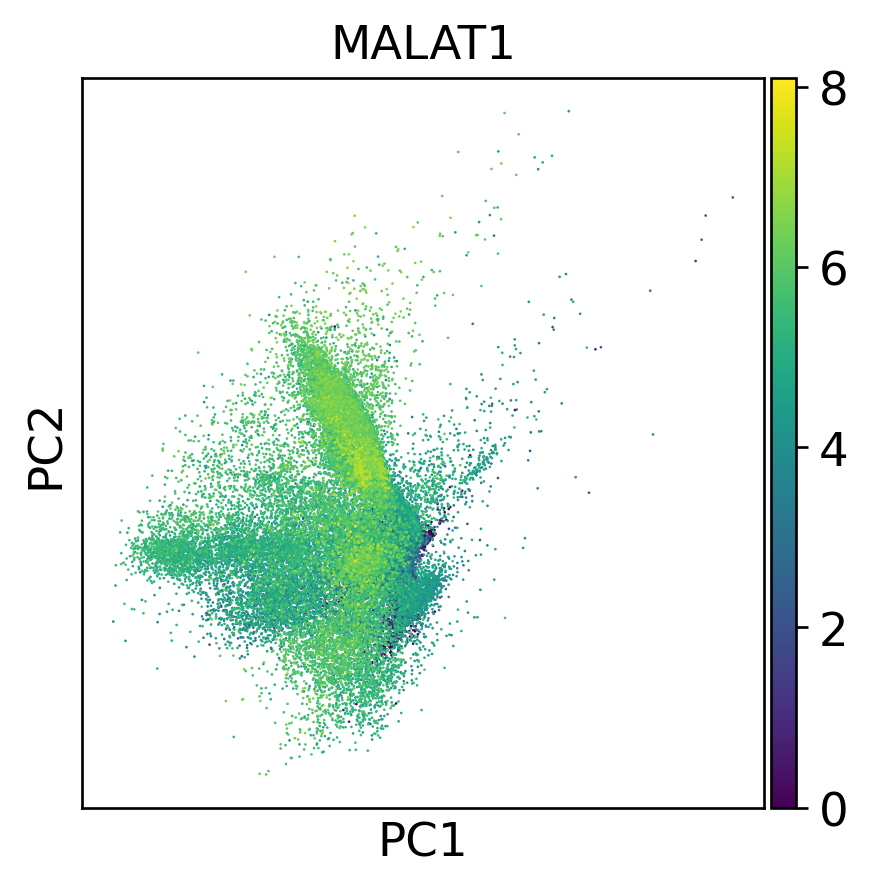

In [44]:
sc.tl.pca(adata, svd_solver='arpack', n_comps=100)
sc.pl.pca(adata, color='MALAT1')

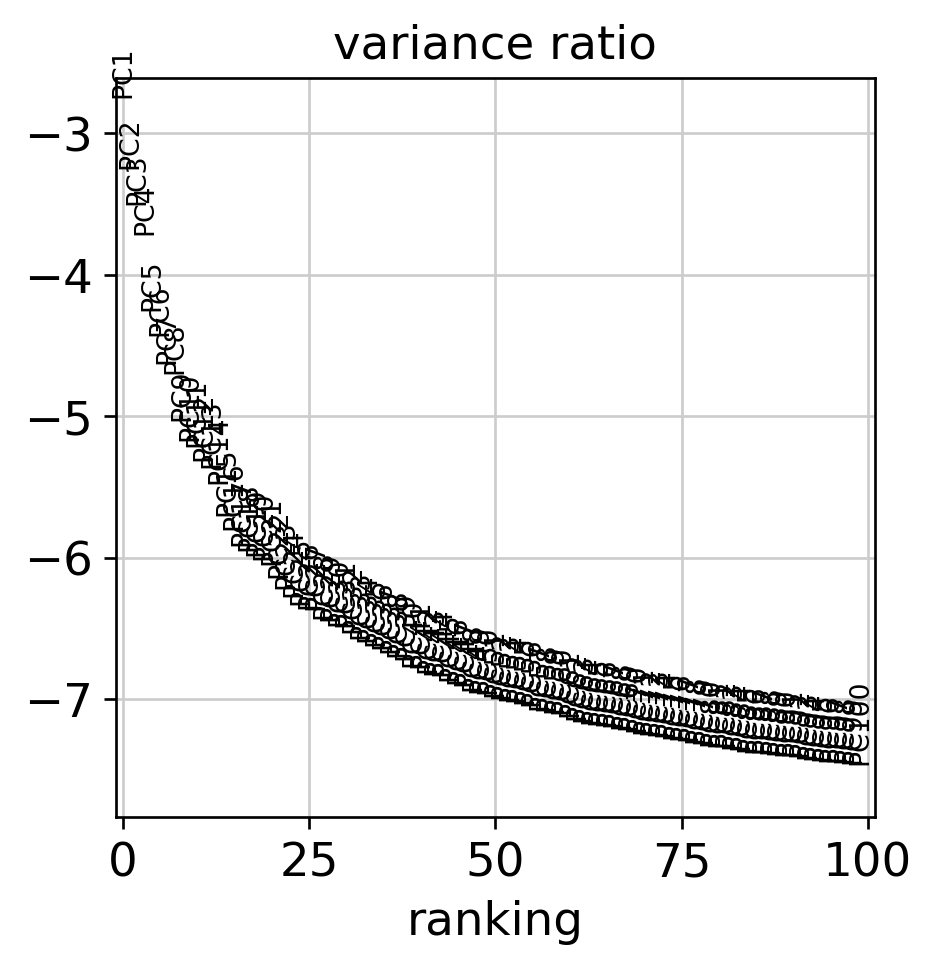

In [45]:
sc.pl.pca_variance_ratio(adata, log=True, n_pcs=100)

In [46]:
sc.pp.neighbors(adata, n_neighbors=10, n_pcs=100)
sc.tl.umap(adata)

computing neighbors
    using 'X_pca' with n_pcs = 100
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:10)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:42)


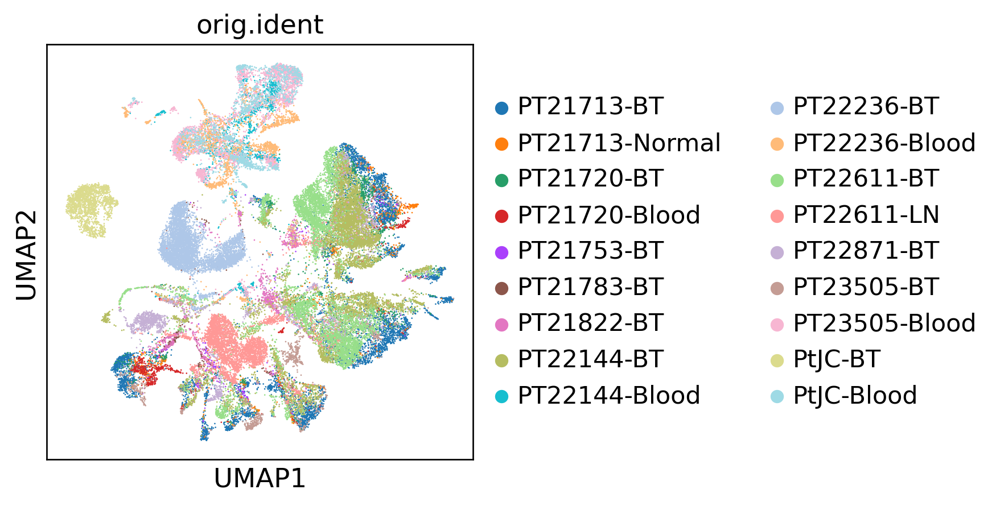

In [47]:
sc.pl.umap(adata, color= "orig.ident",
           save="_" + "without_integration" + '.png')

## UMAP with Intergration

Applying harmony Intergration

In [54]:
adata

AnnData object with n_obs × n_vars = 47579 × 2385
    obs: 'orig.ident', 'sample', 'patient', 'tissue', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'pct_counts_in_top_50_genes', 'pct_counts_in_top_100_genes', 'pct_counts_in_top_200_genes', 'pct_counts_in_top_500_genes', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'n_genes', 'n_counts'
    var: 'gene_ids', 'feature_types', 'mt', 'n_cells_by_counts', 'mean_counts', 'log1p_mean_counts', 'pct_dropout_by_counts', 'total_counts', 'log1p_total_counts', 'n_cells-0', 'n_cells-1', 'n_cells-10', 'n_cells-11', 'n_cells-12', 'n_cells-13', 'n_cells-14', 'n_cells-15', 'n_cells-16', 'n_cells-17', 'n_cells-2', 'n_cells-3', 'n_cells-4', 'n_cells-5', 'n_cells-6', 'n_cells-7', 'n_cells-8', 'n_cells-9', 'highly_variable', 'means', 'dispersions', 'dispersions_norm', 'n_counts', 'mean', 'std'
    uns: 'log1p', 'pca', 'neighbors', 'umap', 'orig.ident_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'

In [57]:
sce.tl.harmony_timeseries(adata, tp="orig.ident", n_components=100)

findfont: Font family ['Raleway'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Lato'] not found. Falling back to DejaVu Sans.


Harmony augmented affinity matrix
Running PCA with 100 components
Nearest neighbor computation...
computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:17:49)


/home/yah2014/anaconda3/envs/r4.0/lib/python3.8/site-packages/harmony/core.py:70: FutureWarning: This location for 'distances' is deprecated. It has been moved to .obsp[distances], and will not be accesible here in a future version of anndata.
  kNN = temp.uns['neighbors']['distances']


Constucting affinities between PT21713-BT and PT21713-Normal...
t+1 neighbors of t...
t neighbors of t+1...
Constucting affinities between PT21713-Normal and PT21720-BT...
t+1 neighbors of t...
t neighbors of t+1...
Constucting affinities between PT21720-BT and PT21720-Blood...
t+1 neighbors of t...
t neighbors of t+1...
Constucting affinities between PT21720-Blood and PT21753-BT...
t+1 neighbors of t...
t neighbors of t+1...
Constucting affinities between PT21753-BT and PT21783-BT...
t+1 neighbors of t...
t neighbors of t+1...
Constucting affinities between PT21783-BT and PT21822-BT...
t+1 neighbors of t...
t neighbors of t+1...
Constucting affinities between PT21822-BT and PT22144-BT...
t+1 neighbors of t...
t neighbors of t+1...
Constucting affinities between PT22144-BT and PT22144-Blood...
t+1 neighbors of t...
t neighbors of t+1...
Constucting affinities between PT22144-Blood and PT22871-BT...
t+1 neighbors of t...
t neighbors of t+1...
Constucting affinities between PT22871-BT an

100%|██████████| 500/500 [10:31<00:00,  1.26s/it]

BarnesHut Approximation  took  213.36  seconds
Repulsion forces  took  382.51  seconds
Gravitational forces  took  1.34  seconds
Attraction forces  took  18.86  seconds
AdjustSpeedAndApplyForces step  took  6.81  seconds


findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


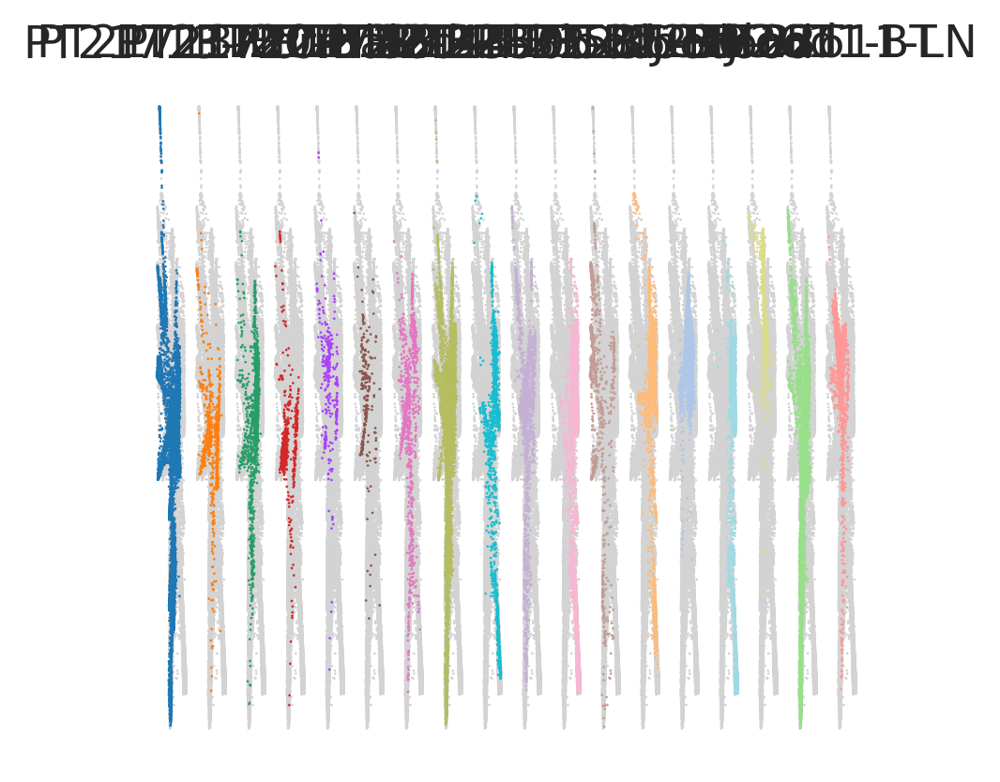

In [58]:
sce.pl.harmony_timeseries(adata,)

In [69]:
adata.obsm['X_pca_copy'] = adata.obsm['X_pca']
adata.obsm['X_pca'] = adata.obsm['X_harmony']
sc.pp.neighbors(adata,n_neighbors=100)
sc.tl.umap(adata)

computing neighbors
    using 'X_pca' with n_pcs = 2
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:46)
computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:43)


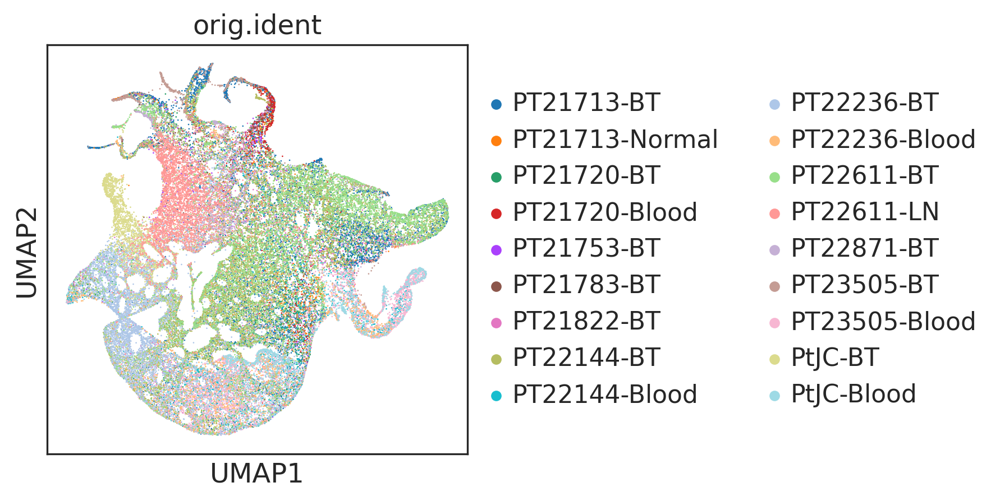

In [70]:
sc.pl.umap(adata, color='orig.ident')

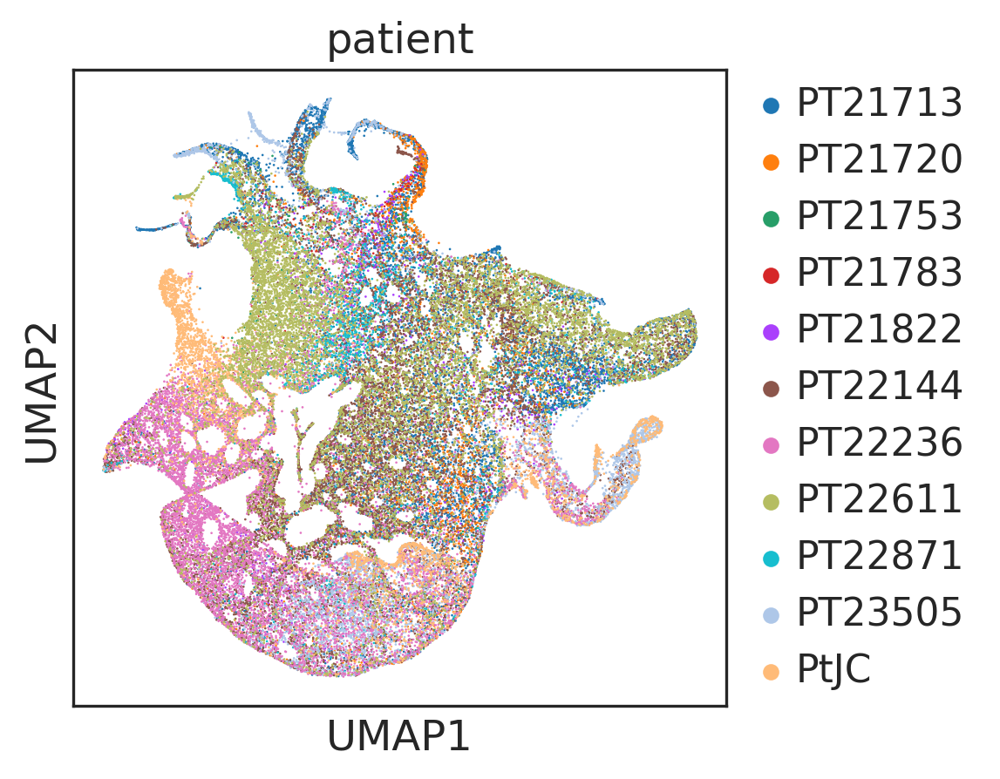

In [71]:
sc.pl.umap(adata, color='patient')

*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB or RGBA sequence, which should be avoided as value-mapping will have precedence in case its length matches with *x* & *y*.  Please use the *color* keyword-argument or provide a 2-D array with a single row if you intend to specify the same RGB or RGBA value for all points.
*c* argument looks like a single numeric RGB o

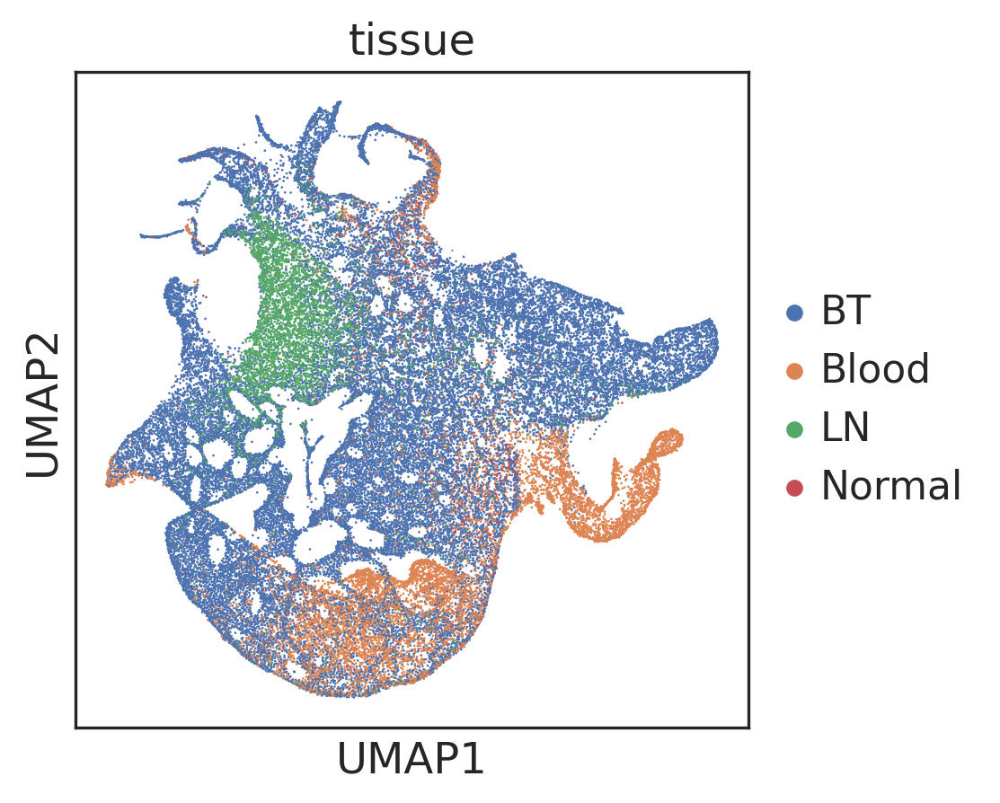

In [72]:
sc.pl.umap(adata, color='tissue')

In [82]:
adata.write(results_file)

## Finding marker genes

Let us compute a ranking for the highly differential genes in each cluster. For this, by default, the .raw attribute of AnnData is used in case it has been initialized before. The simplest and fastest method to do so is the t-test.

running Leiden clustering
    finished: found 52 clusters and added
    'leiden', the cluster labels (adata.obs, categorical) (0:00:59)


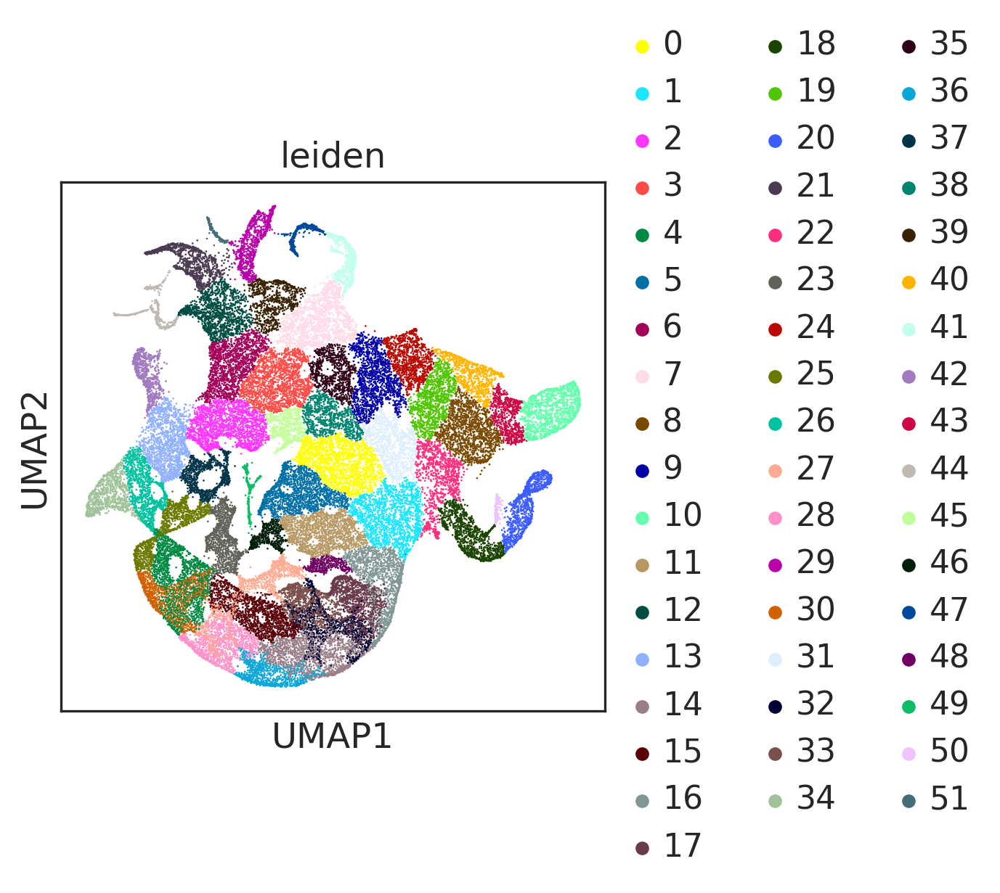

In [74]:
sc.tl.leiden(adata, key_added="leiden")
sc.pl.umap(adata, color='leiden')

ranking genes
    finished: added to `.uns['rank_genes_groups']`
    'names', sorted np.recarray to be indexed by group ids
    'scores', sorted np.recarray to be indexed by group ids
    'logfoldchanges', sorted np.recarray to be indexed by group ids
    'pvals', sorted np.recarray to be indexed by group ids
    'pvals_adj', sorted np.recarray to be indexed by group ids (0:01:16)


findfont: Font family ['Bitstream Vera Sans'] not found. Falling back to DejaVu Sans.


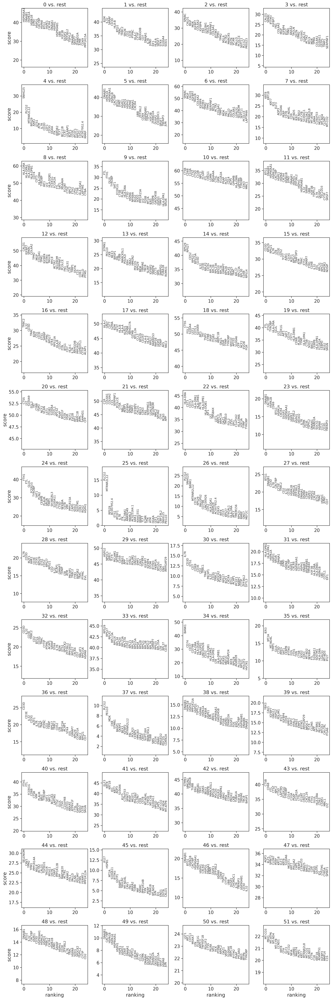

In [75]:
sc.tl.rank_genes_groups(adata, 'leiden', method='wilcoxon')
sc.pl.rank_genes_groups(adata, n_genes=25, sharey=False)

In [77]:
adata.obs

,orig.ident,sample,patient,tissue,n_genes_by_counts,log1p_n_genes_by_counts,total_counts,log1p_total_counts,pct_counts_in_top_50_genes,pct_counts_in_top_100_genes,pct_counts_in_top_200_genes,pct_counts_in_top_500_genes,total_counts_mt,log1p_total_counts_mt,pct_counts_mt,n_genes,n_counts,leiden
AAACCCAAGCACGGAT-1-0-0,PT21713-BT,0,PT21713,BT,1596,7.375882,5699.0,8.648221,46.587121,56.413406,67.046850,80.294789,1365.0,7.219642,23.951571,1596,5699.0,24
AAACCCAAGGACGCAT-1-0-0,PT21713-BT,0,PT21713,BT,1497,7.311886,4049.0,8.306472,32.403062,44.529513,57.273401,74.685107,223.0,5.411646,5.507533,1497,4049.0,31
AAACCCAAGGGCGAAG-1-0-0,PT21713-BT,0,PT21713,BT,2574,7.853605,12978.0,9.471088,39.605486,51.163507,63.476653,77.754662,714.0,6.572283,5.501618,2574,12978.0,8
AAACCCACAATACCTG-1-0-0,PT21713-BT,0,PT21713,BT,1073,6.979145,2113.0,7.656337,39.706578,47.278751,57.122575,72.882158,290.0,5.673323,13.724563,1073,2113.0,3
AAACCCACAATCCTAG-1-0-0,PT21713-BT,0,PT21713,BT,1505,7.317212,3566.0,8.179481,36.231071,46.634885,56.898486,71.817162,263.0,5.575949,7.375211,1505,3566.0,23
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
TTTGTTGCAAGTTGGG-1-17-17,PT22611-LN,17,PT22611,LN,1759,7.473069,3985.0,8.290544,34.052698,41.706399,51.518193,68.130489,122.0,4.812184,3.061481,1759,3985.0,6
TTTGTTGCACTTGGCG-1-17-17,PT22611-LN,17,PT22611,LN,5216,8.559678,31082.0,10.344417,30.097806,43.301589,55.401840,67.482787,895.0,6.797940,2.879480,5216,31082.0,3
TTTGTTGGTAGCTCGC-1-17-17,PT22611-LN,17,PT22611,LN,331,5.805135,541.0,6.295266,42.883549,57.301294,75.785582,100.000000,33.0,3.526361,6.099815,331,541.0,6
TTTGTTGGTCGCTTAA-1-17-17,PT22611-LN,17,PT22611,LN,809,6.697034,1456.0,7.284135,30.425824,41.826923,56.730769,78.777473,27.0,3.332205,1.854396,809,1456.0,6


## SingleR

In [7]:
adata = sc.read_h5ad("../output/20200729_SCT.h5ad")

In [43]:
adata.obs_names #adata.obs["barcodes"] = 

Index(['AAACCCAAGCACGGAT-1-0-0', 'AAACCCAAGGACGCAT-1-0-0',
       'AAACCCAAGGGCGAAG-1-0-0', 'AAACCCACAATACCTG-1-0-0',
       'AAACCCACAATCCTAG-1-0-0', 'AAACCCAGTCCTGGGT-1-0-0',
       'AAACCCATCTGCACCT-1-0-0', 'AAACGAAAGAAAGCGA-1-0-0',
       'AAACGAAAGCGGGTTA-1-0-0', 'AAACGAAAGTCAATCC-1-0-0',
       ...
       'TTTGGTTGTCGTATGT-1-17-17', 'TTTGGTTGTGGTTTGT-1-17-17',
       'TTTGGTTGTGTCTTAG-1-17-17', 'TTTGTTGAGCATAGGC-1-17-17',
       'TTTGTTGAGCGGGTTA-1-17-17', 'TTTGTTGCAAGTTGGG-1-17-17',
       'TTTGTTGCACTTGGCG-1-17-17', 'TTTGTTGGTAGCTCGC-1-17-17',
       'TTTGTTGGTCGCTTAA-1-17-17', 'TTTGTTGTCTCACGAA-1-17-17'],
      dtype='object', length=47579)

In [46]:
adata.obs.index[1] == adata.obs_names[1]

True

In [3]:
adata.obsm['X_pca'] = adata.obsm['X_pca_copy']

In [4]:
adata.write("../output/20200729_SCT.h5ad")

In [22]:
counts = pd.DataFrame(data=adata.raw.X.toarray(), index=adata.obs_names, columns=adata.raw.var_names)
meta_data = adata.obs
#counts.to_csv("../output/20200729_SCT_rawCounts.csv")
#eta_data.to_csv("../output/20200729_meta_data.csv")

In [41]:
import pyreadr
pyreadr.write_rds("../output/20200729_metadata.rds", meta_data)
pyreadr.write_rds("../output/20200729_SCT_rawCounts.rds", t(counts))

TypeError: 'numpy.ndarray' object is not callable

In [27]:
import anndata2ri
anndata2ri.activate()
%reload_ext rpy2.ipython

In [29]:
%%R -i counts -i meta_data

library(SingleCellExperiment)
dim(counts)

KeyboardInterrupt: 

In [25]:
%%R -i counts -i meta_data

library(SingleCellExperiment)
dim(counts)
SCT <- SingleCellExperiment(list(logcounts=t(counts)),
                            colData=DataFrame(meta_data))
saveRDS(SCT,file = "../output/20200728_seuratSCT.rds")

KeyboardInterrupt: 

In [ ]:
%%R -i adata
library(SingleCellExperiment)
sce <- SceToSingleCellAssay(adata, class = "SingleCellAssay")
saveRDS(sce,file = "../output/20200728_sceSCT.rds")

In [22]:
%%R -o singlerDF
singler = readRDS("../output/singlerT_BladderCancer_20200722.rds")
singlerDF = data.frame("singler1sub" = singler$singler[[1]]$SingleR.single$labels,
                       "sub_types" = singler$singler[[1]]$SingleR.single.main$labels,
                       row.names = rownames(singler$singler[[1]]$SingleR.single$labels),
                       stringsAsFactors = F)
singlerDF$main_types = gsub("\\ .*","", singlerDF$sub_types)

Major cell types

In [38]:
%%R
dim(singlerDF)

[1] 48153     3


In [34]:
%%R
library(magrittr)
library(knitr)
print(table(singlerDF$main_types))


       Adipocytes        Astrocytes           B-cells         Basophils 
             1749               120              2321                15 
     Chondrocytes               CLP               CMP   Dendritic-cells 
               66                21                74               263 
Endothelial-cells       Eosinophils  Epithelial-cells      Erythrocytes 
             1449                 4              2758               644 
      Fibroblasts               GMP               HSC     Keratinocytes 
             4451                50                93               390 
      Macrophages    Megakaryocytes       Melanocytes               MEP 
             3948               102                 4               334 
  Mesangial-cells         Monocytes               MPP          Myocytes 
               26              9397                65               175 
          Neurons       Neutrophils          NK-cells             PBMCs 
              193                 9              2

Minor cell types

In [35]:
%%R
print(table(singlerDF$sub_types))


                     Adipocytes                  Adipocytes Pre 
                           1748                               1 
                     Astrocytes                  B-cells memory 
                            120                            1954 
                  B-cells naive            B-cells plasma-cells 
                             42                             325 
                      Basophils                    Chondrocytes 
                             15                              66 
                            CLP                             CMP 
                             21                              74 
        Dendritic-cells myeloid    Dendritic-cells plasmacytoid 
                            100                             163 
              Endothelial-cells Endothelial-cells microvascular 
                            487                             962 
                    Eosinophils                Epithelial-cells 
                        